In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from numpy.random import seed
seed(8212025)

from models import KeckTelescope
from influenc_funcs import gaussian_influence_function
from prysm.interferogram import render_synthetic_surface
from prysm.coordinates import make_xy_grid, cart_to_polar
from prysm.x.dm import DM

from san import SpeckleAreaNulling   
from SANKalman import SANKalman, KFSAN

In [2]:
def build_sim_env():
    """Build telescope, DM, and WFE identical to run_san.py."""
    Npup = 1024
    # seed(8212025)
    x, y, z = render_synthetic_surface(10, Npup, a=5e4, b=1/1000, c=3)
    wavefront_error = z / 1 
    keck = KeckTelescope(center_wavelength=1.65, bandwidth=1, starting_wfe=wavefront_error) 
    # --- detector parameters ------------
    keck.dark_current       = 5     # e⁻ /s
    keck.read_noise         = 1     # e⁻ /s
    keck.bias               = 10    # e⁻
    keck.bits               = 16
    keck.full_well_capacity = 2 ** (keck.bits*3)
    keck.conversion_gain    = 1     # e⁻ / DN
    keck.exposure_time      = 100  # s

    Nd = keck.dark_current * keck.exposure_time
    NR = keck.read_noise

    # --- DM ---------------
    nact, act_pitch, spa = 22, 3, 42       
    sampling_pitch = act_pitch / spa   
    
    x, y = make_xy_grid(keck.Npup, dx=sampling_pitch)
    r, _ = cart_to_polar(x, y)
    infl = gaussian_influence_function(r, act_pitch)
    dm = DM(infl, x.shape[0], nact, spa, rot=(0, 0, 0), shift=(0, 0))
    dm.act_pitch = act_pitch

    return keck, dm, wavefront_error, Nd, NR

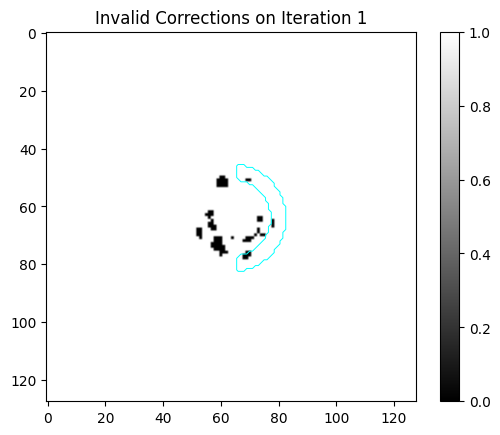

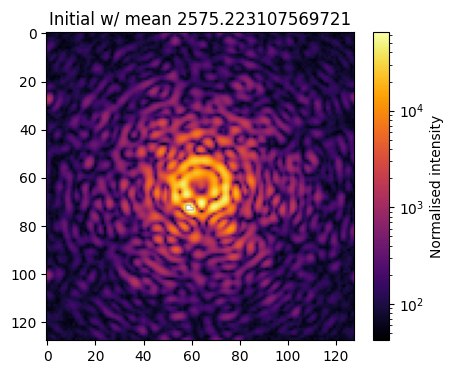

Iter 00 | ⟨I⟩_DH = 6.475e+03


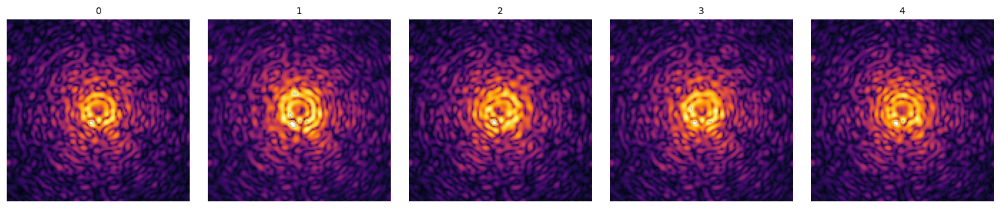

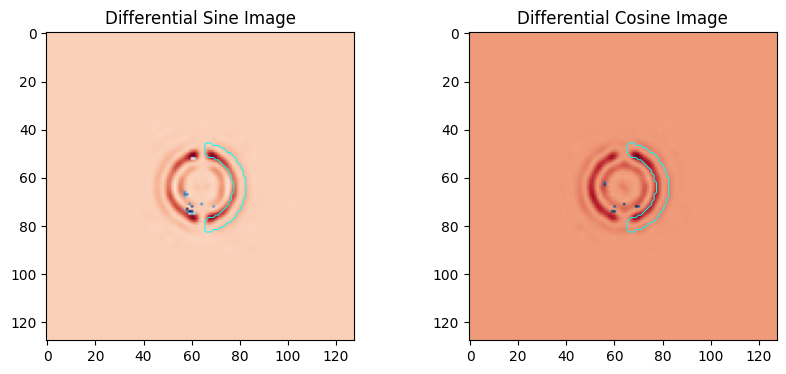

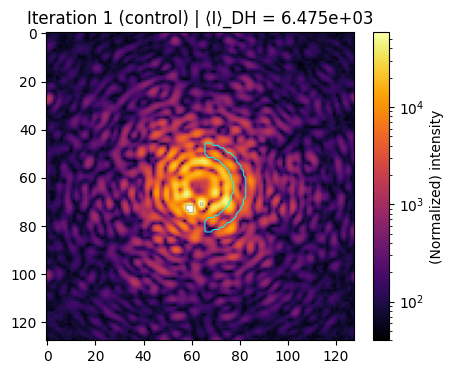

Iter 01 | ⟨I⟩_DH = 1.297e+04


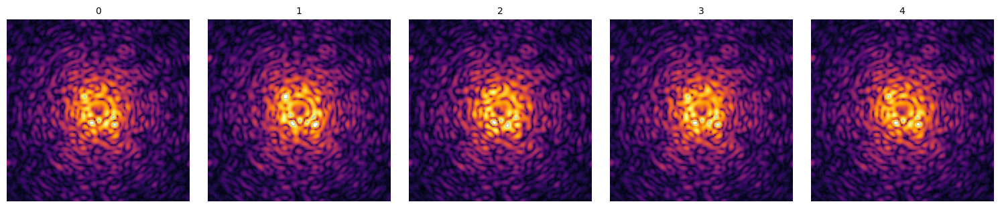

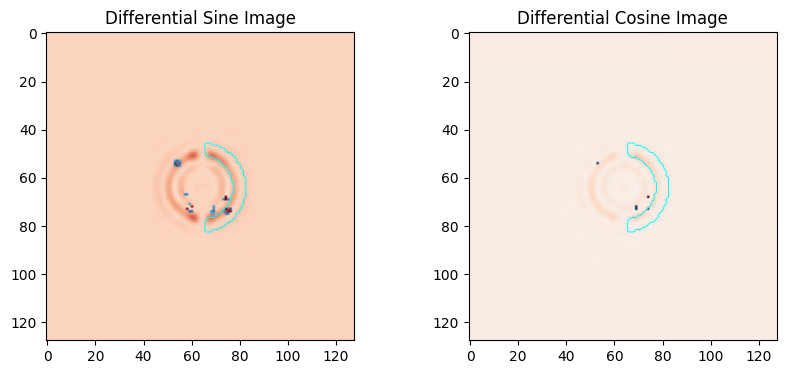

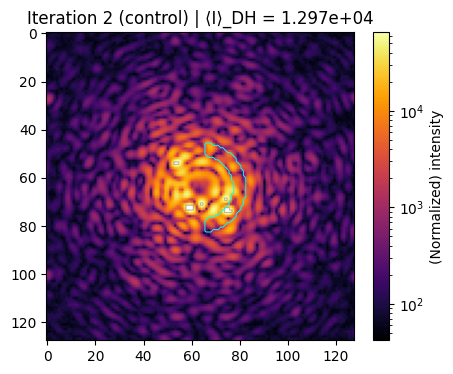

In [ ]:
# USER SETTINGS
# ------------------------------------------------------------------
nsteps        = 5          # number of Kalman iterations
apply_control = True        # send DM correction u each step
show_plots    = True        # display DH image every iteration
# ------------------------------------------------------------------


# Build telescope, DM
keck, dm, wfe_offset, Nd, NR = build_sim_env()     

global ref
# ref = keck.get_coronagraph_image(include_fpm=False).max()
ref = 1

# SAN helper
san = SpeckleAreaNulling(
    propagation=keck.get_coronagraph_image,
    dx_img=keck.dx_img,
    epd=keck.epd, efl=keck.efl, wvl=keck.center_wavelength,
    dm=dm,
    IWA=5, OWA=7,
    angular_range=[-85, 85],
)
'''plt.figure(figsize=(5, 4))
plt.title("Dark Hole")
plt.contour(san.dh, levels=[0.5], colors='black', linewidths=0.7)
plt.show()'''

# Kalman filter
mask = san.dh.astype(bool)
kf = SANKalman(mask=mask,
               gain=keck.conversion_gain,
               q_process=1e-6)


# Function to get one 5-frame burst
def acquire_burst(sys, san_obj, dm, probe_amplitude):
    images = []
    I0 = sys.get_coronagraph_image(include_fpm=True, wfe=dm.render(wfe=True)) / ref
    images.append(I0)

    probe_amplitude = 0.7

    for probe in (-san_obj.sin_probe, san_obj.sin_probe,
                  -san_obj.cos_probe, san_obj.cos_probe):
        probe *= probe_amplitude
        dm.actuators[:] += probe

        I = sys.get_coronagraph_image(include_fpm=True,
                                      wfe=dm.render(wfe=True) ) / ref
        
        dm.actuators -= probe
        images.append(I)

    I1m, I1p, I2m, I2p = images[1:]
    return I0, I1p, I1m, I2p, I2m


def snr_image_ccd(I_adu, G, Ns_e=0.0, Nd_e=0.0, Nr_e=0.0):
    """
    Per-pixel SNR for an image in ADU using the CCD equation.
    Ns_e, Nd_e, Nr_e are electrons/pixel accumulated over the exposure.
    """
    var_adu = (I_adu / G) + (Ns_e + Nd_e + Nr_e**2) / (G**2)
    sigma   = np.sqrt(np.clip(var_adu, 0, None))
    return np.divide(I_adu, sigma, out=np.zeros_like(I_adu, float), where=sigma > 0)


    
# Initialize P0, R with first burst
I0, I1p, I1m, I2p, I2m = acquire_burst(keck, san, dm, wfe_offset)
kf.initialize(I0, I1p, I1m, I2p, I2m, rigorous=True,
                   Ns=0, Nd=Nd, Nr=NR)

zero_mask = np.ones_like(I0)
imgs = [I0, I1p, I1m, I2p, I2m]
for im in imgs:
    zero_mask[im == 0] = 0

plt.figure()
plt.title("Invalid Corrections on Iteration 1")
plt.imshow(zero_mask, cmap="gray")
plt.colorbar()
plt.contour(mask, levels=[0.5], colors='cyan', linewidths=0.7)
plt.show()

plt.figure(figsize=(5, 4))
mean0 = np.mean(I0[mask])
plt.title("Initial w/ mean " + str(mean0))
plt.imshow(I0, cmap='inferno', norm=LogNorm())
plt.colorbar(label='Normalised intensity')
plt.show()


# Kalman-SAN
means = []
res_p, res_q   = [], []   
sig_p, sig_q   = [], []    # 3-sigma bounds

for k in range(nsteps):
    '''u_signal = np.zeros_like(dm.actuators)
    if np.allclose(u_signal, 0):          # no control stroke this step
        kf.predict(control=False)
    else:                                 # stroke was applied
        kf.predict(control=True)
'''

    u_prev = None
    if apply_control and (u_prev is not None):
        kf.predict(u=u_prev)
    else:
        kf.predict(u=None)


    I0, I1p, I1m, I2p, I2m = acquire_burst(keck, san, dm, wfe_offset)
    kf.update(I0, I1p, I1m, I2p, I2m)

    # Compute mask of invalid pixels
    zero_mask = np.ones_like(I0)
    imgs = [I0, I1p, I1m, I2p, I2m]
    for im in imgs:
        zero_mask[im == 0] = 0

    # Only get the pixels in the control region
    zero_mask = zero_mask[mask==1]
    zero_mask = zero_mask[..., None, None]
    

    y0, y1 = kf.last_innovation           
    res_p.append(np.mean(y0))
    res_q.append(np.mean(y1))
    # 3-sigma = 3·sqrt(diag P⁺)   (posterior already computed)
    sig_p.append(3 * np.sqrt(np.mean(kf.P[:, 0, 0])))
    sig_q.append(3 * np.sqrt(np.mean(kf.P[:, 1, 1])))                       


    # control
    if apply_control:
        sin_c = -kf.x[0][:, None, None]
        cos_c = -kf.x[1][:, None, None]
        dm.actuators[:] += ((zero_mask * (0.5*sin_c * san.sin_modes + 0.5*cos_c * san.cos_modes)).sum(axis=0))

        u_signal = (zero_mask * (sin_c * san.sin_modes + cos_c * san.cos_modes)).sum(axis=0)
        u_prev = np.vstack([-kf.x[0], -kf.x[1]]) * 0.5

        '''max_iter = 5
        tol = 1e-4
        for j in range(max_iter):
            x_prev = kf.x.copy()
            kf.predict(control=None)                     # no further DM move
            I0, I1p, I1m, I2p, I2m = acquire_burst(keck, san, dm, wfe_offset)
            kf.update(I0, I1p, I1m, I2p, I2m)
            if np.linalg.norm(kf.x - x_prev) / np.sqrt(kf.npix) < tol:
                break'''

    else:
        u_signal = np.zeros_like(dm.actuators)

    # diagnostics
    img = keck.get_coronagraph_image(include_fpm=True,
                                     wfe=dm.render(wfe=True)) / ref
    means.append(np.mean(img[mask]))
    print(f"Iter {k:02d} | ⟨I⟩_DH = {means[-1]:.3e}")
    
    
    if show_plots:
        imgs = [I0, I1p, I1m, I2p, I2m]

        # Optional: use the same grayscale contrast across panels (only if all are 2D)
        vmin = vmax = None
        if all(img.ndim == 2 for img in imgs):
            vmin = min(np.min(img) for img in imgs)
            vmax = max(np.max(img) for img in imgs)

        fig, axes = plt.subplots(1, 5, figsize=(15, 3), constrained_layout=True)

        for i, (ax, img) in enumerate(zip(axes, imgs)):
            if img.ndim == 2:  # grayscale
                ax.imshow(img, cmap='inferno', norm=LogNorm())
            else:              # RGB/RGBA
                ax.imshow(img)
            ax.set_title(f"{i}", fontsize=10)
            ax.axis('off')

        plt.show()

        plt.figure(figsize=(10, 4))
        plt.subplot(121)
        plt.title("Differential Sine Image")
        plt.imshow(I1p + I1m - 2*I0, cmap='RdBu_r')
        plt.contour(mask, levels=[0.5], colors='cyan', linewidths=0.7)
        plt.subplot(122)
        plt.title("Differential Cosine Image")
        plt.imshow(I2p + I2m - 2*I0, cmap='RdBu_r')
        plt.contour(mask, levels=[0.5], colors='cyan', linewidths=0.7)
        plt.show()
        

        plt.figure(figsize=(5, 4))
        plt.title(f"Iteration {k+1} ({'control' if apply_control else 'open'}) | ⟨I⟩_DH = {means[-1]:.3e}")
        plt.imshow(img, cmap='inferno', norm=LogNorm())
        plt.colorbar(label='(Normalized) intensity')
        plt.contour(mask, levels=[0.5], colors='cyan', linewidths=0.7)
        plt.show()
        
        '''N_s = 0.0                                   # electrons/pix from sky (if any)
        N_d = keck.dark_current * keck.exposure_time
        N_r = keck.read_noise

        snr_img = snr_image_ccd(img, keck.conversion_gain, Ns_e=N_s, Nd_e=N_d, Nr_e=N_r)

        plt.figure(figsize=(5,4))
        plt.title("Per-pixel SNR (CCD equation)")
        plt.imshow(snr_img, cmap='magma')
        plt.colorbar(label='SNR')
        # draw DH outline if you like
        plt.contour(san.dh, levels=[0.5], colors='w', linewidths=0.8)
        plt.show()'''


        
# Convergence plot
plt.figure()
plt.semilogy(means, marker='o')
plt.xlabel("Iteration")
plt.ylabel("Mean DH (normalized) intensity")
plt.title("Kalman-SAN convergence")
plt.grid(True)
plt.show()

In [ ]:
# Build telescope, DM, SAN helper as you already do ...
# mask = san.dh.astype(bool) (or however you define the DH)
keck, dm, wfe_offset, Nd, NR = build_sim_env()     

global ref
# ref = keck.get_coronagraph_image(include_fpm=False).max()
ref = 1

# SAN helper
san = SpeckleAreaNulling(
    propagation=keck.get_coronagraph_image,
    dx_img=keck.dx_img,
    epd=keck.epd, efl=keck.efl, wvl=keck.center_wavelength,
    dm=dm,
    IWA=4, OWA=7,
    angular_range=[-85, 85],
)

# Kalman filter (using the updated KFSAN above)
mask = san.dh.astype(bool)
kf = KFSAN(mask=mask, q_process=1e-6, init_var=1.0, gamma=1.0, gate_sigma=5.0)

# first burst initializes x,P,R from data (not logs, not normalized)
I0, I1p, I1m, I2p, I2m = acquire_burst(keck, san, dm, wfe_offset)
kf.initialize_from_burst(I0, I1p, I1m, I2p, I2m, rigorous=True,
                   Ns=0, Nd=Nd, Nr=NR)

u_prev = None
prev_x = kf.x.copy()
means = []

EPS = 1e-12
def safe_div(num, den):
    return np.divide(num, den, out=np.zeros_like(num, dtype=float),
                     where=np.abs(den) > EPS)

def estimate_gamma(prev_x, u_prev, z_meas, clip=(0.05, 5.0)):
    if u_prev is None:
        return None
    dx = (z_meas - prev_x).reshape(-1)
    uu = u_prev.reshape(-1)
    m = np.isfinite(dx) & np.isfinite(uu) & (np.abs(uu) > 1e-10)
    if not np.any(m):
        return None
    ratios = dx[m] / uu[m]
    ghat = float(np.median(ratios))
    lo, hi = clip
    return max(lo, min(hi, ghat)) if ghat >= 0 else -max(lo, min(hi, abs(ghat)))

for k in range(nsteps):
    
    I0, I1p, I1m, I2p, I2m = acquire_burst(keck, san, dm, wfe_offset)

    # ---- z_meas for Γ fit
    den1 = np.maximum(2.0*(I1p + I1m - 2.0*I0), EPS)
    den2 = np.maximum(2.0*(I2p + I2m - 2.0*I0), EPS)
    p_meas = safe_div(I1p - I1m, den1)
    q_meas = safe_div(I2p - I2m, den2)
    z_meas = np.vstack([
        p_meas.ravel()[kf.pix_inds],
        q_meas.ravel()[kf.pix_inds]
    ])

    # ---- adapt Γ BEFORE predict 
    ghat = estimate_gamma(prev_x=prev_x, u_prev=u_prev, z_meas=z_meas)
    if ghat is not None:
        kf.gamma = ghat 

    kf.predict(u_prev if u_prev is not None else None)

    kf.update_with_burst(I0, I1p, I1m, I2p, I2m)

    u = kf.control(loop_gain=0.25, clip=5.0)

    u_signal = (u[0][:, None, None] * san.sin_modes +
                u[1][:, None, None] * san.cos_modes).sum(axis=0)

    dm.actuators[:] -= u_signal

    # record for next predict
    u_prev = u.copy()     
    prev_x = kf.x.copy()

    # ---- diagnostics
    img = keck.get_coronagraph_image(include_fpm=True, wfe=dm.render(wfe=True))
    means.append(np.mean(img[mask]))
    print(f"Iter {k:02d} | ⟨I⟩_DH = {means[-1]:.3e}")
    plt.figure(figsize=(5, 4))
    plt.title(f"Iteration {k+1} ({'control' if apply_control else 'open'}) | ⟨I⟩_DH = {means[-1]:.3e}")
    plt.imshow(img, cmap='inferno', norm=LogNorm())
    plt.colorbar(label='(Normalized) intensity')
    plt.contour(mask, levels=[0.5], colors='cyan', linewidths=0.7)
    plt.show()

    imgs = [I0, I1p, I1m, I2p, I2m]
    vmin = vmax = None
    if all(img.ndim == 2 for img in imgs):
        vmin = min(np.min(img) for img in imgs)
        vmax = max(np.max(img) for img in imgs)

    fig, axes = plt.subplots(1, 5, figsize=(15, 3), constrained_layout=True)

    for i, (ax, img) in enumerate(zip(axes, imgs)):
        if img.ndim == 2: 
            ax.imshow(img, cmap='inferno', norm=LogNorm())
        else:              
            ax.imshow(img)
        ax.set_title(f"{i}", fontsize=10)
        ax.axis('off')

    plt.show()


Iter 00 | ⟨I⟩_DH = 5.429e+03


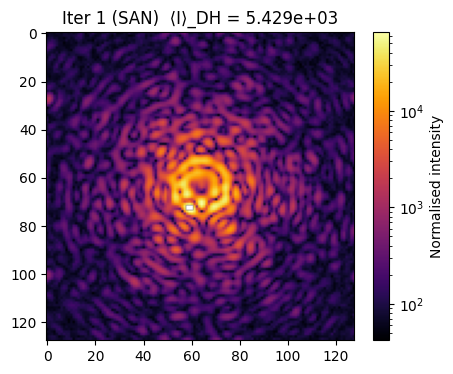

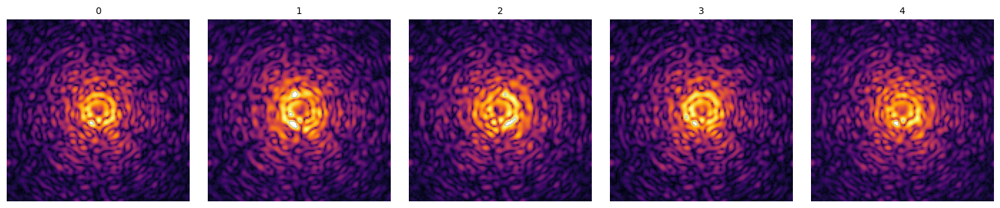

Iter 01 | ⟨I⟩_DH = 5.166e+03


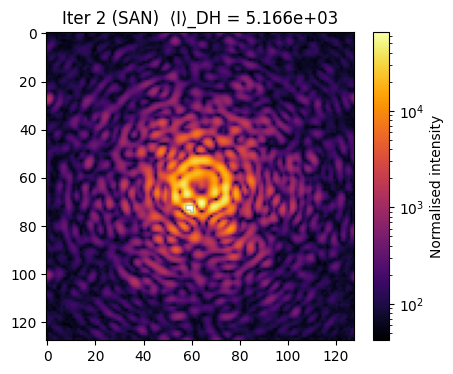

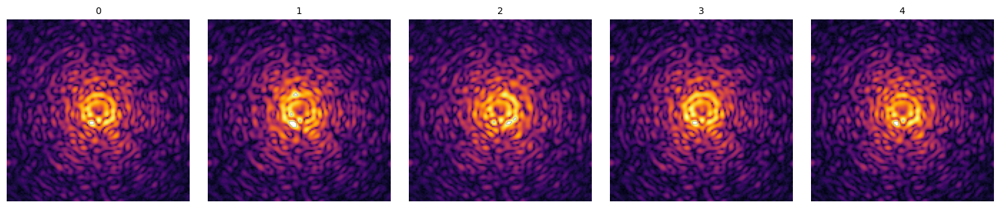

Iter 02 | ⟨I⟩_DH = 4.950e+03


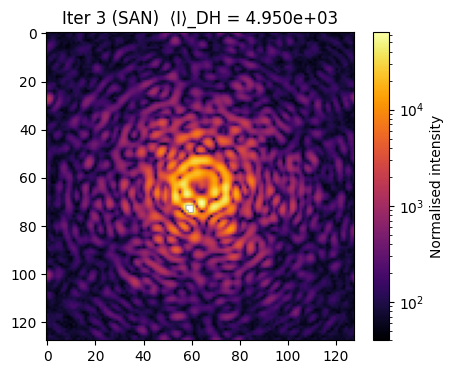

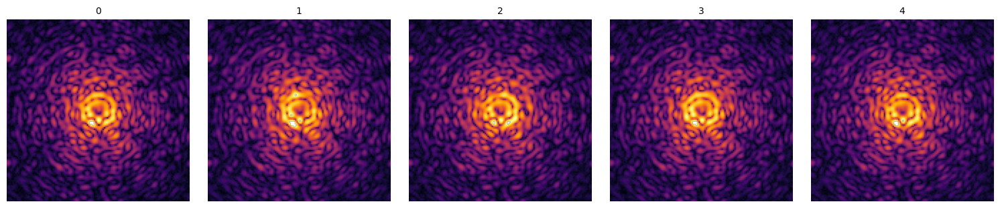

Iter 03 | ⟨I⟩_DH = 4.804e+03


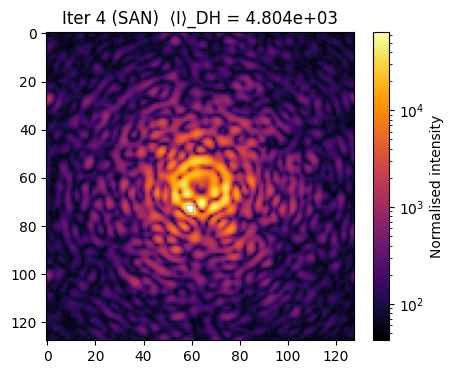

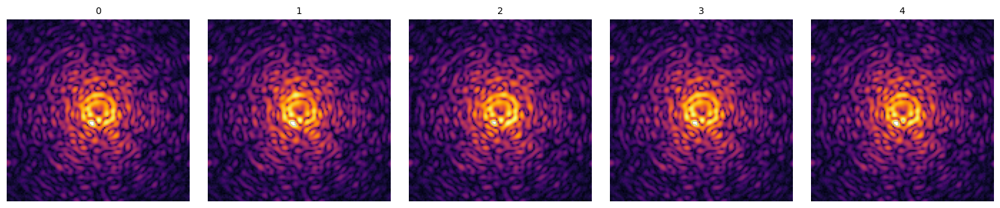

Iter 04 | ⟨I⟩_DH = 4.709e+03


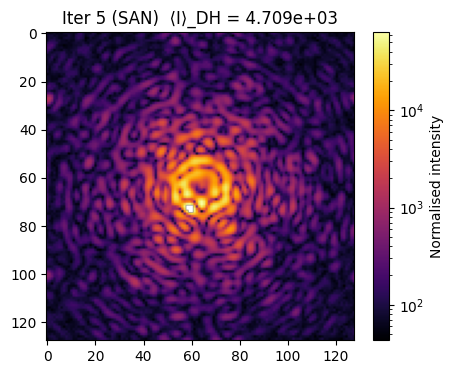

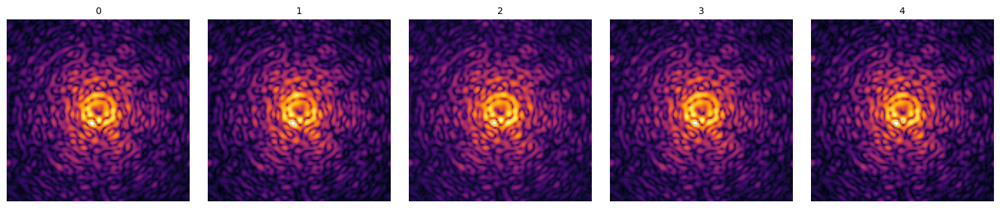

Iter 05 | ⟨I⟩_DH = 4.641e+03


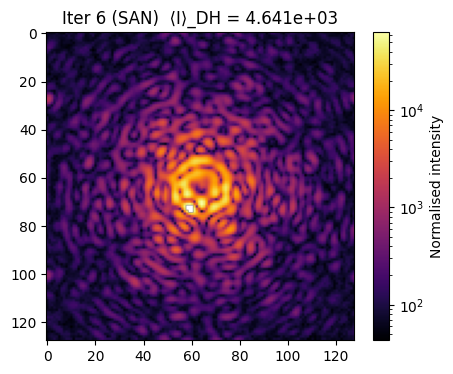

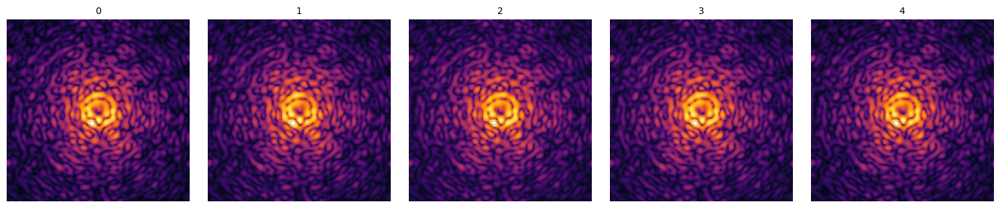

Iter 06 | ⟨I⟩_DH = 4.595e+03


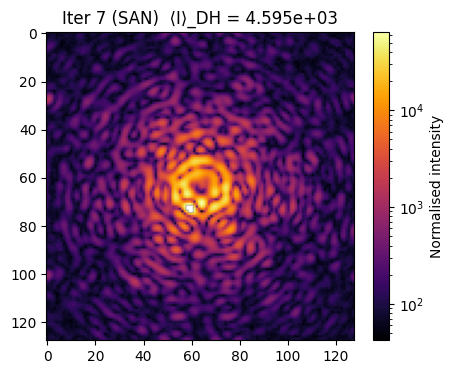

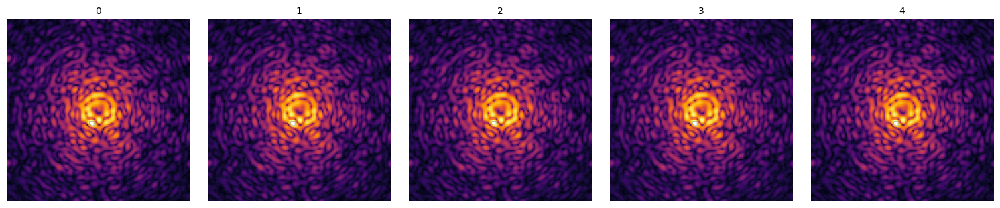

Iter 07 | ⟨I⟩_DH = 4.567e+03


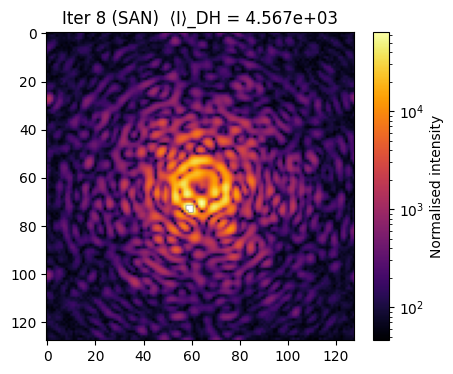

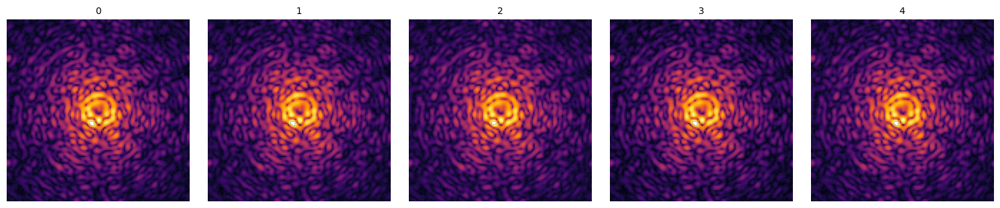

Iter 08 | ⟨I⟩_DH = 4.545e+03


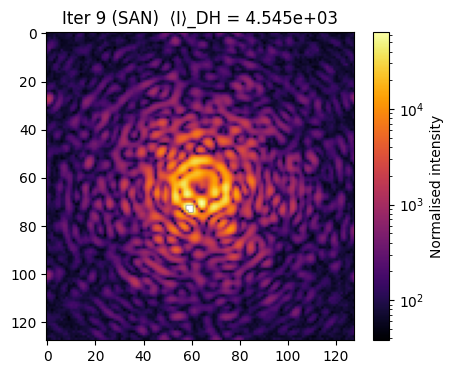

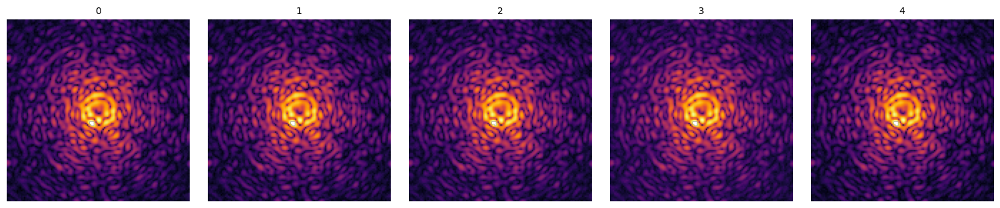

Iter 09 | ⟨I⟩_DH = 4.521e+03


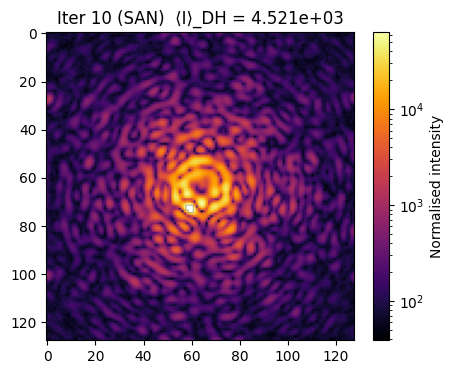

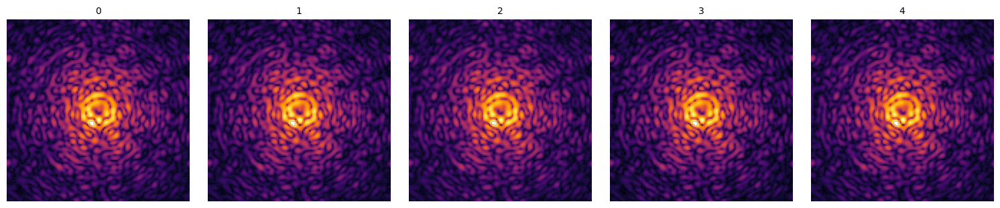

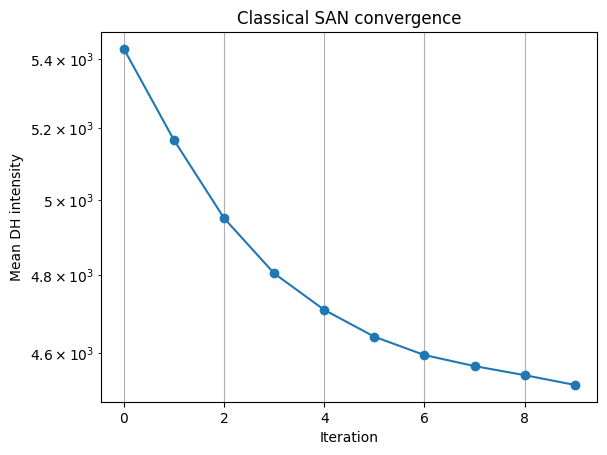

In [101]:
# SAN regularization for comparison

nsteps        = 10
apply_control = True
show_plots    = True
regularization = 1e5         

keck, dm, wfe_offset, Nd, NR = build_sim_env()     

# SAN helper
san = SpeckleAreaNulling(
    propagation=keck.get_coronagraph_image,
    dx_img=keck.dx_img,
    epd=keck.epd, efl=keck.efl, wvl=keck.center_wavelength,
    dm=dm,
    IWA=4, OWA=7,
    angular_range=[-85, 85],
)

means = []
for k in range(nsteps):

    # 5-frame burst
    I0, I1p, I1m, I2p, I2m = acquire_burst(keck, san, dm, wfe_offset)

    dE1   = (I1p - I1m) / 4
    dE2   = (I2p - I2m) / 4
    dE1sq = (I1p + I1m - 2*I0) / 2
    dE2sq = (I2p + I2m - 2*I0) / 2

    sin_coeffs = dE1 / (dE1sq + regularization)
    cos_coeffs = dE2 / (dE2sq + regularization)

    # restrict to dark hole
    dh_mask = san.dh.astype(bool) 
    sin_c = (-sin_coeffs[dh_mask]).reshape(-1, 1, 1) 
    cos_c = (-cos_coeffs[dh_mask]).reshape(-1, 1, 1)

    if apply_control:
        stroke = (sin_c * san.sin_modes + cos_c * san.cos_modes).sum(axis=0)
        dm.actuators += stroke

    # diagnostics
    img = keck.get_coronagraph_image(include_fpm=True,
                                     wfe=dm.render(wfe=True)) / ref
    means.append(np.mean(img[dh_mask]))
    print(f"Iter {k:02d} | ⟨I⟩_DH = {means[-1]:.3e}")

    if show_plots:
        plt.figure(figsize=(5,4))
        plt.title(f"Iter {k+1} (SAN)  ⟨I⟩_DH = {means[-1]:.3e}")
        plt.imshow(img, cmap='inferno', norm=LogNorm())
        plt.colorbar(label='Normalised intensity')
        plt.show()
        imgs = [I0, I1p, I1m, I2p, I2m]
        

        # Optional: use the same grayscale contrast across panels (only if all are 2D)
        vmin = vmax = None
        if all(img.ndim == 2 for img in imgs):
            vmin = min(np.min(img) for img in imgs)
            vmax = max(np.max(img) for img in imgs)

        fig, axes = plt.subplots(1, 5, figsize=(15, 3), constrained_layout=True)

        for i, (ax, img) in enumerate(zip(axes, imgs)):
            if img.ndim == 2:  # grayscale
                ax.imshow(img, cmap='inferno', norm=LogNorm())
            else:              # RGB/RGBA
                ax.imshow(img)
            ax.set_title(f"{i}", fontsize=10)
            ax.axis('off')

        plt.show()


# Convergence curve
plt.figure()
plt.semilogy(means, marker='o')
plt.xlabel('Iteration'); plt.ylabel('Mean DH intensity')
plt.title('Classical SAN convergence'); plt.grid(True); plt.show()


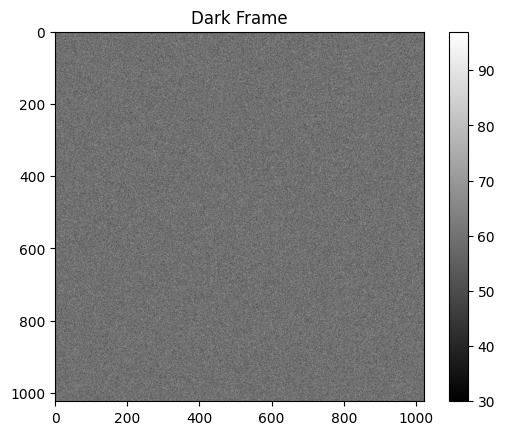

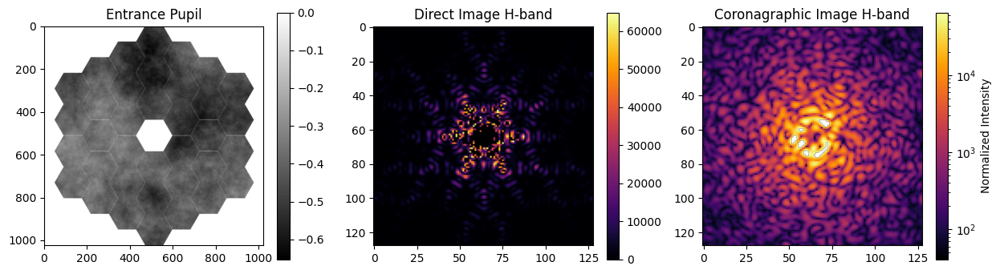

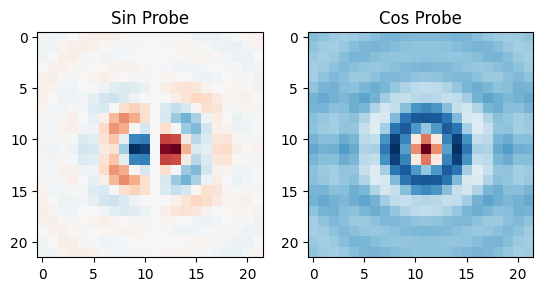

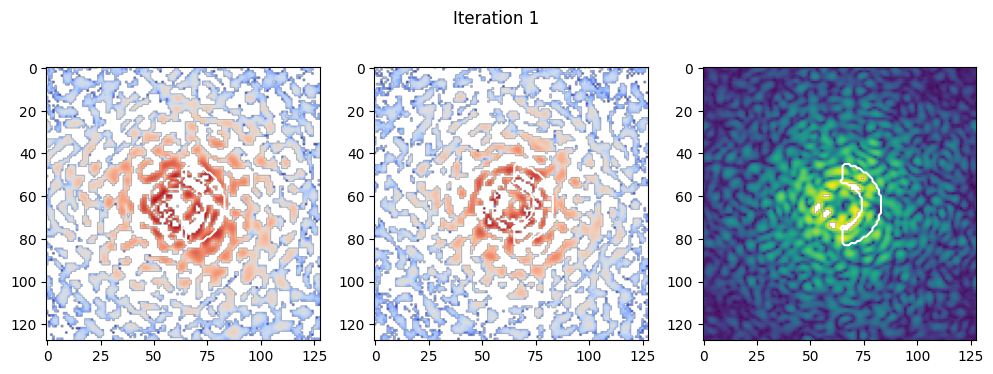

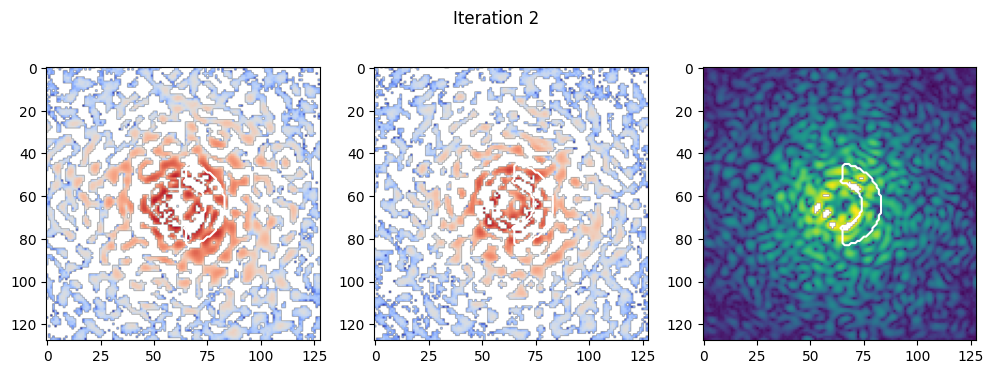

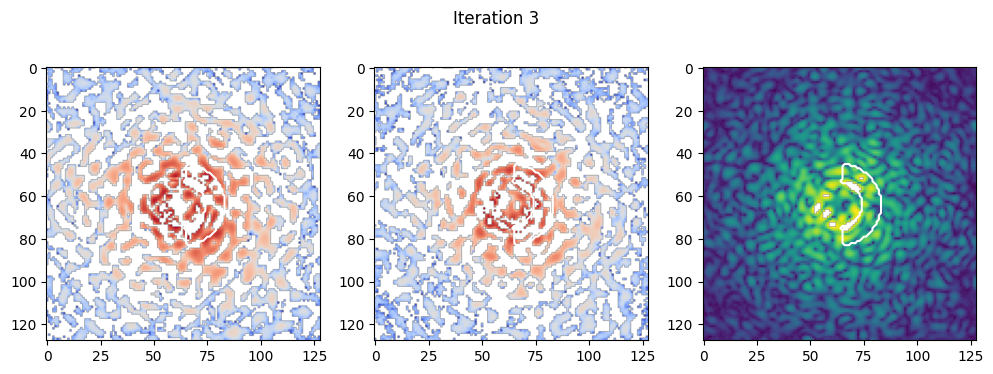

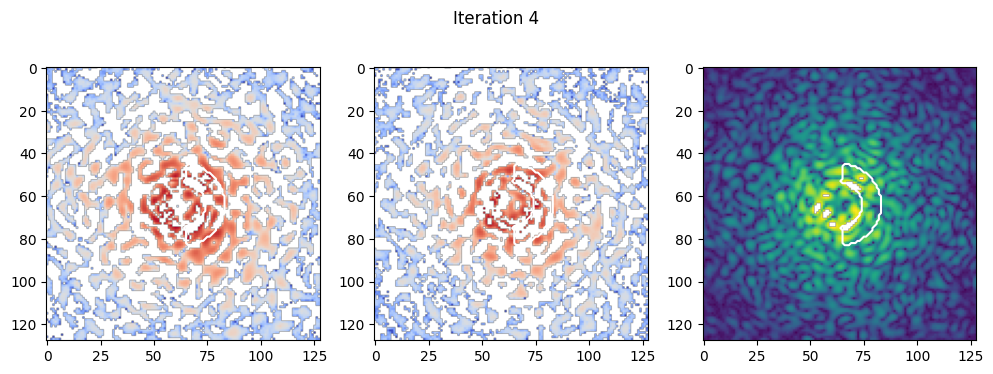

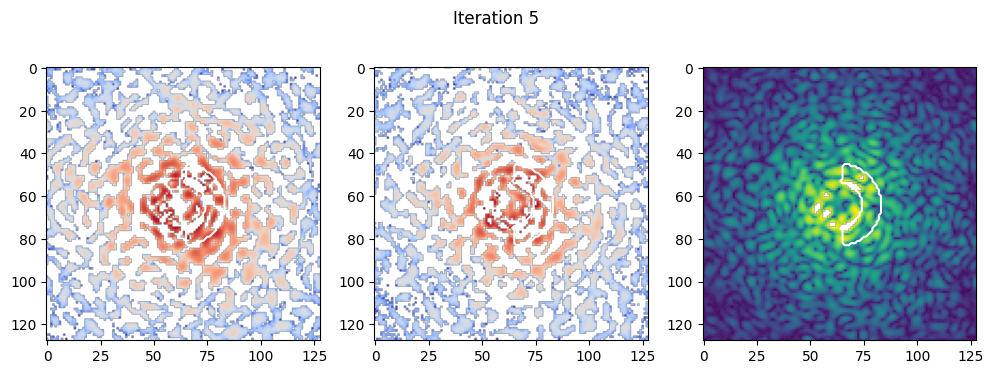

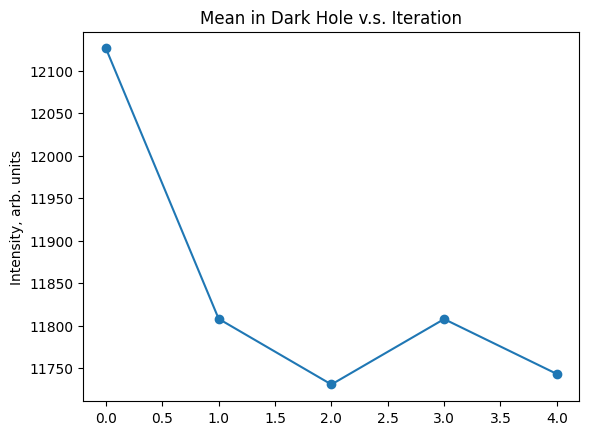

In [ ]:
# Set up wavefront error - ideally this doesn't change
Npup = 1024
x, y, z = render_synthetic_surface(10, Npup, a=5e4, b=1/1000, c=3)
wavefront_error = z / 1

keck = KeckTelescope(center_wavelength=1.65, # microns
                     bandwidth=1, # percent
                     starting_wfe=wavefront_error)

# Detector Quantities can be set here
keck.dark_current = 5 # electrons / s
keck.read_noise = 1 # electrons / s
keck.bias = 10 # electrons
keck.bits = 16 # bits
keck.full_well_capacity = 2 ** keck.bits # bit depth
keck.conversion_gain = 1 # electrons / DN
keck.exposure_time = 100 # seconds


# Here for normalization, not strictly necessary
ref = 1

plt.figure(figsize=[15, 4])
plt.subplot(131)
plt.title("Entrance Pupil")
plt.imshow(keck.get_entrance_pupil() * z, cmap="gray")
plt.colorbar()
plt.subplot(132)
plt.title("Direct Image H-band")
plt.imshow(keck.get_direct_image() / ref, cmap="inferno")
plt.colorbar()
plt.subplot(133)
plt.title("Coronagraphic Image H-band")
plt.imshow(keck.get_coronagraph_image(include_fpm=True, wfe=wavefront_error) / ref, cmap="inferno", norm=LogNorm())
plt.colorbar(label="Normalized Intensity")


# Set up a deformable mirror
nact = 22
act_pitch = 3
samples_per_act = 42
sampling_pitch = act_pitch / samples_per_act

x, y = make_xy_grid(keck.Npup, dx=sampling_pitch)
r, th = cart_to_polar(x, y)
influence_func = gaussian_influence_function(r, act_pitch)
Nout = x.shape[0]
dm = DM(influence_func, Nout, nact, samples_per_act, rot=(0,0,0), shift=(0,0))
dm.act_pitch = act_pitch


# Try out running SAN
san = SpeckleAreaNulling(
    propagation=keck.get_coronagraph_image,
    dx_img=keck.dx_img,
    epd=keck.epd,
    efl=keck.efl,
    wvl=keck.center_wavelength,
    dm=dm,
    IWA=4,
    OWA=7,
    angular_range=[-85, 85],
)

plt.figure()
plt.subplot(121)
plt.title("Sin Probe")
plt.imshow(san.sin_probe, cmap="RdBu_r")
plt.subplot(122)
plt.title("Cos Probe")
plt.imshow(san.cos_probe, cmap="RdBu_r")

NSTEPS = 5
corrected_images = []
mean_in_dh = []
for i in range(NSTEPS):
    img = san.step(regularization=100000)
    corrected_images.append(img)
    mean_in_dh.append(np.mean(img[san.dh==1]))
    plt.figure(figsize=[12, 4])
    plt.suptitle(f"Iteration {i+1}")
    plt.subplot(131)
    plt.imshow(san.Im1, cmap="coolwarm", norm=LogNorm())
    plt.contour(san.dh, levels=[0,5], colors="w")
    plt.subplot(132)
    plt.imshow(san.Im2, cmap="coolwarm", norm=LogNorm())
    plt.contour(san.dh, levels=[0,5], colors="w")
    plt.subplot(133)
    plt.imshow(img, norm=LogNorm())
    plt.contour(san.dh, levels=[0,5], colors="w")

plt.figure()
plt.plot(mean_in_dh, marker="o")
plt.ylabel("Intensity, arb. units")
plt.title("Mean in Dark Hole v.s. Iteration")
plt.show()
